In [1]:
%matplotlib inline
import numpy as np
import h5py as h5
from IPython.display import Image
# make sure the notebook kernel is built in a psana-py2 environment
from src.average_runs import *

# Exploration of the hits deposited on CXIDB
Three teams have deposited their analysis on CXIDB at the following link: [id-58](https://www.cxidb.org/id-58.html).
We downloaded the file named `singleHitList.h5` and used it to retrieve the corresponding images. Before running our scripts over the whole experiment, we show below a way to explore it on a run-by-run basis

In [3]:
FIGURE_DIR="/cds/home/f/fpoitevi/Toolkit/skopi_figures/validation/pr772/"
CXIDBlist_Filepath=FIGURE_DIR+"singleHitList.h5"
#
print("We hard-coded the following variables {}".format(config_info()))
print("Loading {}".format(CXIDBlist_Filepath))
singleHitList=h5.File(CXIDBlist_Filepath, 'r')
print("List of runs containing hits: {}".format(np.unique(singleHitList['LCLS']['runs'][:])))

We hard-coded the following variables ('amo86615', 'pnccdBack')
Loading /cds/home/f/fpoitevi/Toolkit/skopi_figures/validation/pr772/singleHitList.h5
List of runs containing hits: [182 183 184 185 186 188 190 191 192 193 194 196 197]


For exploration, it could be convenient to store the image corresponding to hits temporarily in individual `.npy` files. For example, for run 190:

In [4]:
save_npy(CXIDBlist_Filepath, 190, outdir=FIGURE_DIR)

[u'DESY', u'LCLS', u'UWM']


  0%|          | 0/1498 [00:00<?, ?it/s]

... creating /cds/home/f/fpoitevi/Toolkit/skopi_figures/validation/pr772/team_LCLS/r190/
Saving team LCLS hits under: /cds/home/f/fpoitevi/Toolkit/skopi_figures/validation/pr772/team_LCLS/r190/


100%|██████████| 1498/1498 [05:48<00:00,  4.30it/s]


Besides the hits identified by the 'LCLS' team, we see that there are also entries for the team 'DESY' and 'UWM'. Just add the argument `team=...` to the `save_npy` call if you want to check those out. The next cell provides some summarized information about the saved hits:

  1%|          | 16/1498 [00:00<00:09, 153.44it/s]

Reading 1498 images from /cds/home/f/fpoitevi/Toolkit/skopi_figures/validation/pr772/team_LCLS/r190/


100%|██████████| 1498/1498 [00:14<00:00, 106.75it/s]


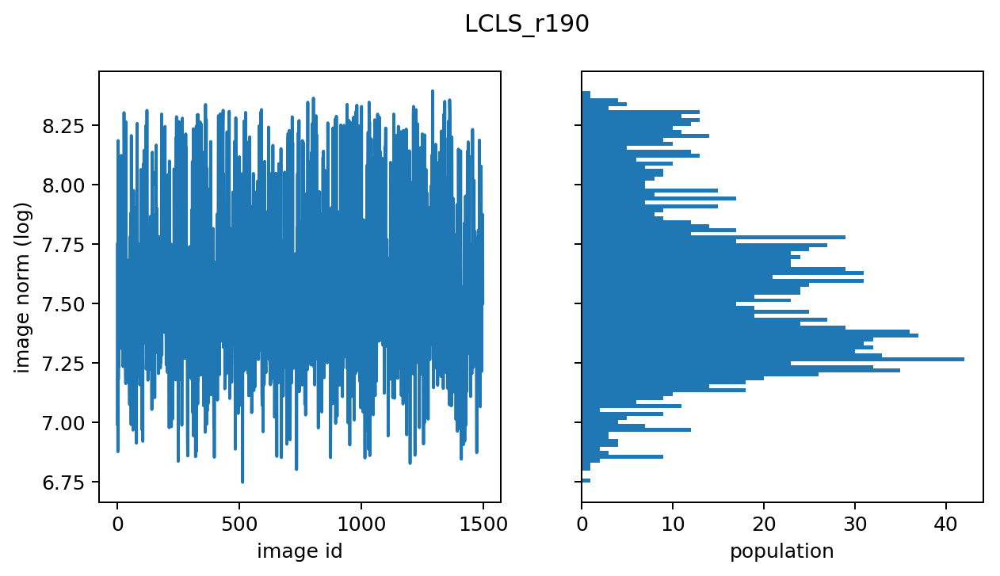

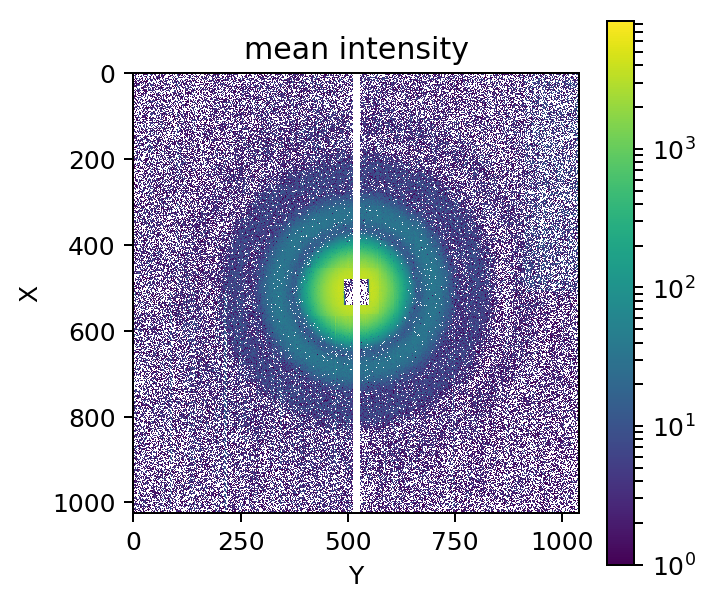

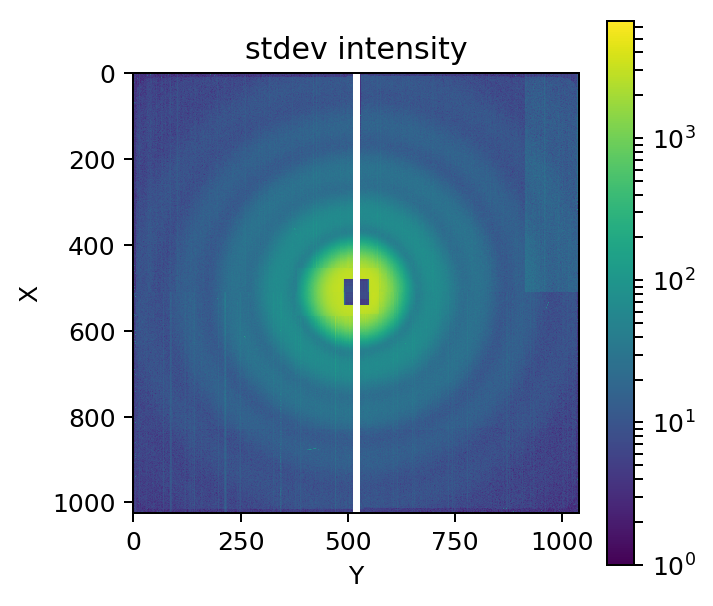

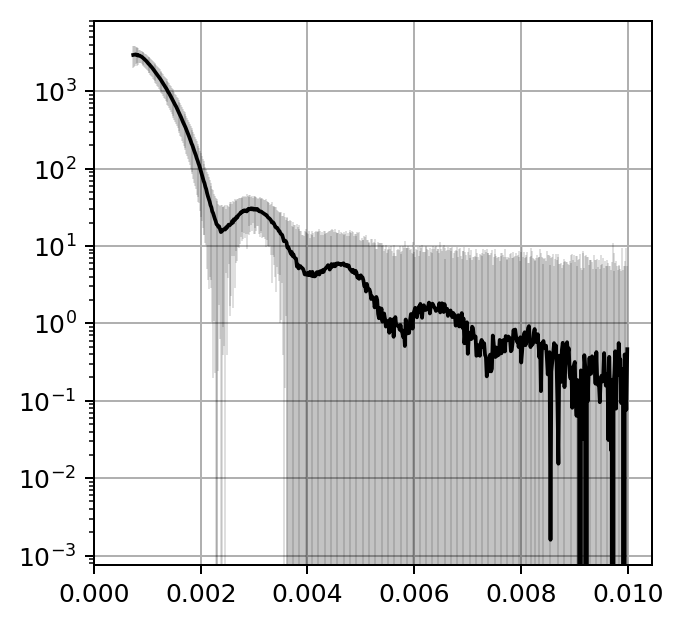

In [5]:
team='LCLS'
runNumber=190
summary(team, runNumber, output_dir=FIGURE_DIR)

In order to process more than one run and get the overall SAXS profile, please refer to the `pr772/README.md`. We display the diffraction pattern averaged over the hits from all runs, and the corresponding SAXS profile:

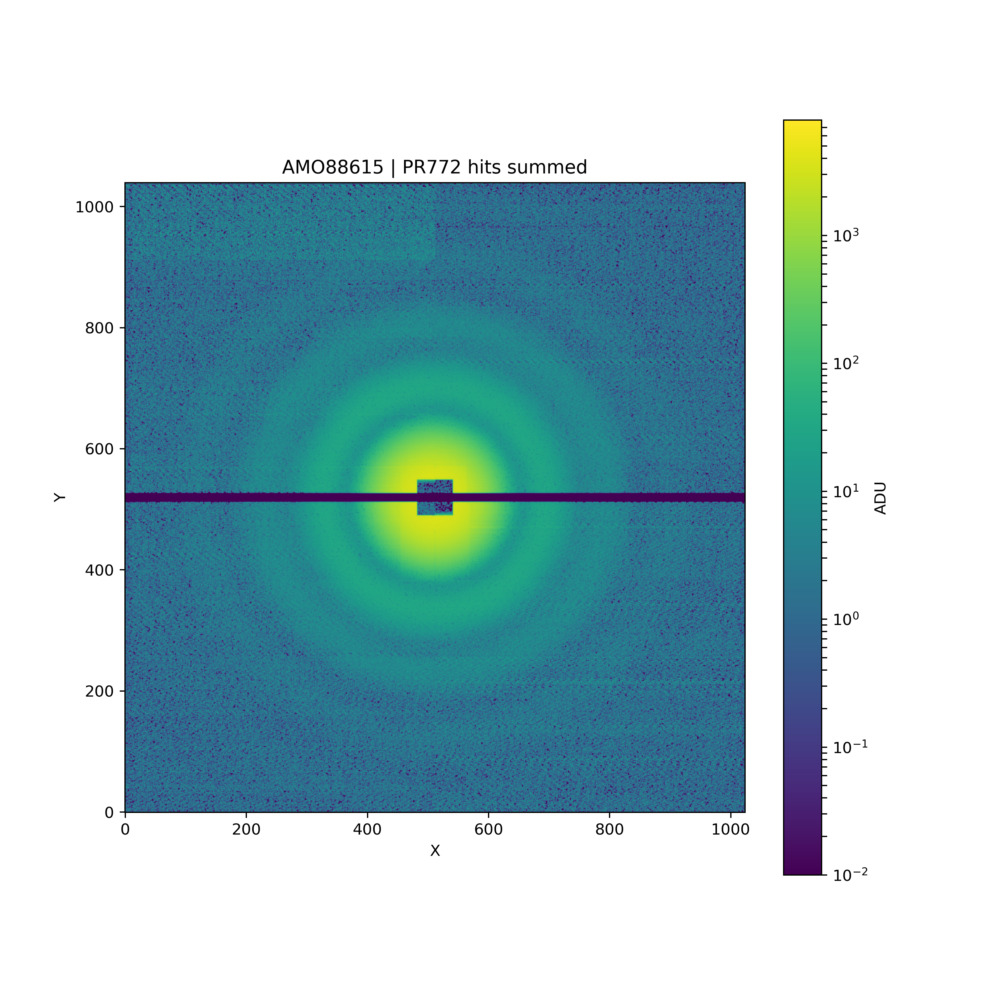

In [3]:
Image(filename="{}/team_LCLS.png".format(FIGURE_DIR))

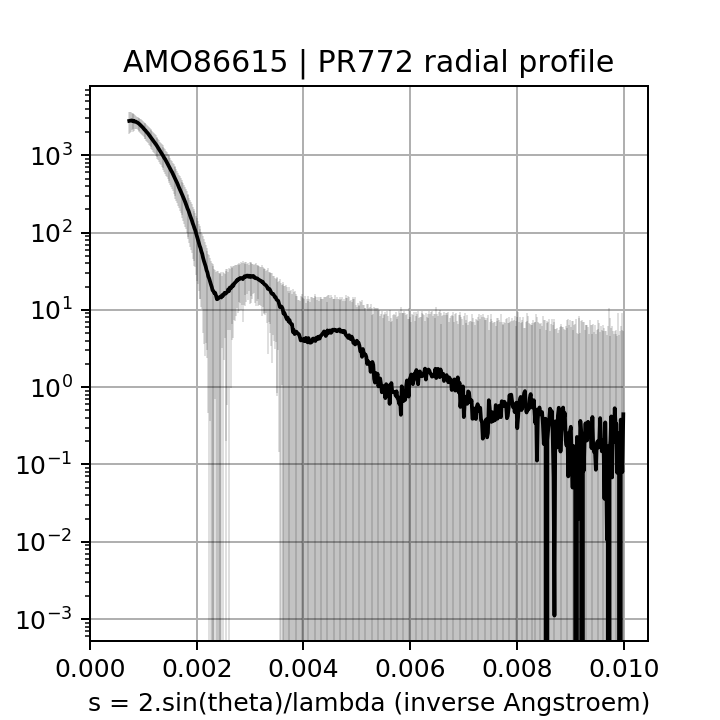

In [8]:
Image(filename="{}/team_LCLS_saxs.png".format(FIGURE_DIR))

Text(0,0.5,'Y')

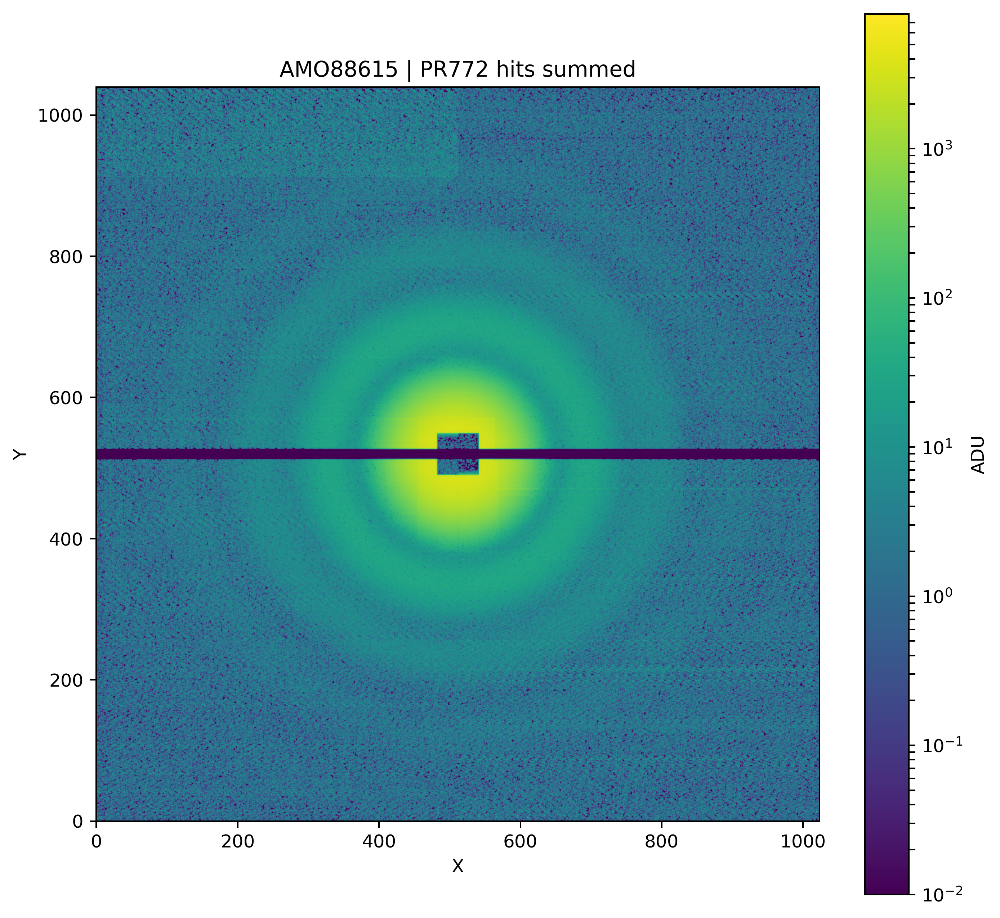

In [4]:
img_mean = np.load("pr772/team_LCLS.npy")
fig = plt.figure(figsize=(9,9),dpi=360)
plt.title('AMO88615 | PR772 hits summed')
img = np.where(img_mean<1e-6, 1e-6, img_mean)[:,:]
plt.imshow(img.T, origin='lower', norm=LogNorm(vmin=1e-2), interpolation='gaussian')
plt.colorbar(label='ADU')
plt.xlabel('X')
plt.ylabel('Y')
#plt.savefig("team_LCLS.png")